In [1]:
pip install hvplot

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import xarray as xr
import hvplot.xarray
import holoviews as hv
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

In [3]:
# Update function for animation
def update(frame, ds):
    ax.clear()
    cax = ax.imshow(out_data.isel(time=frame).values, origin='lower', aspect='auto',
                    extent=[float(ds.lon.min()), float(ds.lon.max()), float(ds.lat.min()), float(ds.lat.max())])
    ax.set_title(f'Time: {str(out_data.time[frame].values)}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    cbar.update_normal(cax)
    return cax,

In [4]:
output_path = '/homes/g24meda/lab/4dvarnet-starter/outputs/finals_QG_15days_lrgmod_01_lrgrad_100_nstep_20_sigma2_kernelsize21_alpha1_1_alpha2_05_avgpool2_dt15min_dimhidd48_onoffnormalization/00-25-36/QG_new_4_nadirs_DC_2020a_ssh/test_data.nc'

In [5]:
test_out = xr.open_dataset(output_path)
test_out

<xarray.Dataset> Size: 28MB
Dimensions:  (time: 20, lat: 240, lon: 240)
Coordinates:
  * time     (time) datetime64[ns] 160B 2013-03-01T12:00:00 ... 2013-03-20T12...
  * lat      (lat) float64 2kB 32.0 32.05 32.1 32.15 ... 43.8 43.85 43.9 43.95
  * lon      (lon) float64 2kB -63.95 -63.9 -63.85 -63.8 ... -52.1 -52.05 -52.0
Data variables:
    inp      (time, lat, lon) float64 9MB ...
    tgt      (time, lat, lon) float64 9MB ...
    out      (time, lat, lon) float64 9MB ...

# 1. Daily plot

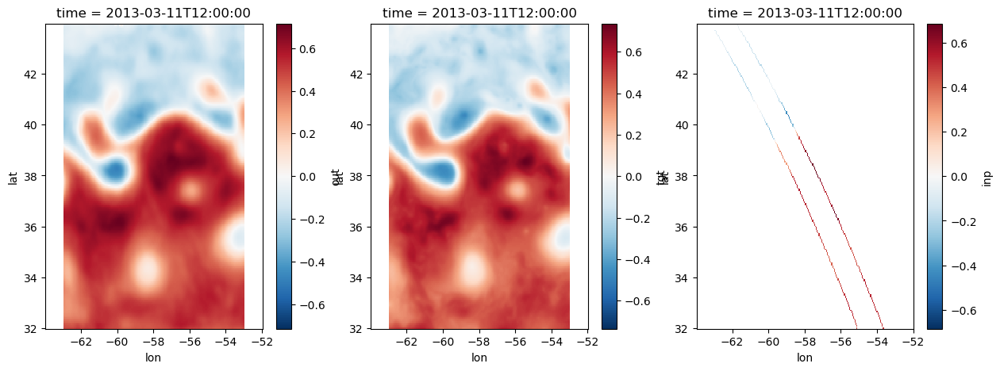

In [6]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plotting each subplot
test_out.out.isel(time=10).plot(ax=axs[0])
test_out.tgt.isel(time=10).plot(ax=axs[1])
test_out.inp.isel(time=10).plot(ax=axs[2])

plt.show()

# 2. Animation

In [7]:
%matplotlib agg
# Extract the data variables and ensure they are loaded into memory
out_data = test_out['out'].load()
tgt_data = test_out['tgt'].load()
inp_data = test_out['inp'].load()

# Determine the global min and max values for the color scale for each variable
vmin, vmax = tgt_data.min().values, tgt_data.max().values

# Create a figure and axis for the plot
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Initialize the plots with the first time slice
cax_out = axs[0].imshow(out_data.isel(time=0).values, origin='lower', aspect='auto',
                        extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                        cmap='coolwarm', vmin=vmin, vmax=vmax);
axs[0].set_title(f'Out Time: {str(out_data.time[0].values)}');
axs[0].set_xlabel('Longitude');
axs[0].set_ylabel('Latitude');
cbar_out = fig.colorbar(cax_out, ax=axs[0], orientation='vertical');
cbar_out.set_label('out');

cax_tgt = axs[1].imshow(tgt_data.isel(time=0).values, origin='lower', aspect='auto',
                        extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                        cmap='coolwarm', vmin=vmin, vmax=vmax);
axs[1].set_title(f'Tgt Time: {str(tgt_data.time[0].values)}');
axs[1].set_xlabel('Longitude');
axs[1].set_ylabel('Latitude');
cbar_tgt = fig.colorbar(cax_tgt, ax=axs[1], orientation='vertical');
cbar_tgt.set_label('tgt');

cax_inp = axs[2].imshow(inp_data.isel(time=0).values, origin='lower', aspect='auto',
                        extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                        cmap='coolwarm', vmin=vmin, vmax=vmax);
axs[2].set_title(f'Inp Time: {str(inp_data.time[0].values)}');
axs[2].set_xlabel('Longitude');
axs[2].set_ylabel('Latitude');
cbar_inp = fig.colorbar(cax_inp, ax=axs[2], orientation='vertical');
cbar_inp.set_label('inp');


# Update function for animation
def update(frame):
    for ax in axs:
        ax.clear()
    
    cax_out = axs[0].imshow(out_data.isel(time=frame).values, origin='lower', aspect='auto',
                            extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                            cmap='coolwarm', vmin=vmin, vmax=vmax)
    axs[0].set_title(f'Out Time: {str(out_data.time[frame].values)}')
    axs[0].set_xlabel('Longitude')
    axs[0].set_ylabel('Latitude')
    cbar_out.update_normal(cax_out)

    cax_tgt = axs[1].imshow(tgt_data.isel(time=frame).values, origin='lower', aspect='auto',
                            extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                            cmap='coolwarm', vmin=vmin, vmax=vmax)
    axs[1].set_title(f'Tgt Time: {str(tgt_data.time[frame].values)}')
    axs[1].set_xlabel('Longitude')
    axs[1].set_ylabel('Latitude')
    cbar_tgt.update_normal(cax_tgt)

    cax_inp = axs[2].imshow(inp_data.isel(time=frame).values, origin='lower', aspect='auto',
                            extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                            cmap='coolwarm', vmin=vmin, vmax=vmax)
    axs[2].set_title(f'Inp Time: {str(inp_data.time[frame].values)}')
    axs[2].set_xlabel('Longitude')
    axs[2].set_ylabel('Latitude')
    cbar_inp.update_normal(cax_inp)

    return cax_out, cax_tgt, cax_inp

# Create the animation
ani = FuncAnimation(fig, update, frames=len(out_data.time), interval=200, blit=False)

# To display the animation inline in a Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

# 3. compare two ssh reconstruction

In [8]:
output_path_bis = '/homes/g24meda/lab/4dvarnet-starter/outputs/Id_lrgmod_01_lrgrad_100_nstep_20_sigma2_kernelsize21_alpha1_1_alpha2_05_avgpool2_dt10min/11-28-12/Id_4_nadirs_DC_2020a_ssh/test_data.nc'

In [9]:
test_out_bis = xr.open_dataset(output_path_bis)
test_out_bis

<xarray.Dataset> Size: 28MB
Dimensions:  (time: 20, lat: 240, lon: 240)
Coordinates:
  * time     (time) datetime64[ns] 160B 2013-03-01T12:00:00 ... 2013-03-20T12...
  * lat      (lat) float64 2kB 32.0 32.05 32.1 32.15 ... 43.8 43.85 43.9 43.95
  * lon      (lon) float64 2kB -63.95 -63.9 -63.85 -63.8 ... -52.1 -52.05 -52.0
Data variables:
    inp      (time, lat, lon) float64 9MB ...
    tgt      (time, lat, lon) float64 9MB ...
    out      (time, lat, lon) float64 9MB ...

In [11]:
%matplotlib agg
# Extract the data variables and ensure they are loaded into memory
out_data = test_out['out'].load()[1:-2,:,:]
tgt_data = test_out['tgt'].load()[1:-2,:,:]
out_bis_data = test_out_bis['out'].load()[1:-2,:,:]

# Determine the global min and max values for the color scale for each variable
vmin, vmax = tgt_data.min().values, tgt_data.max().values

# Create a figure and axis for the plot
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Initialize the plots with the first time slice
cax_out = axs[0].imshow(out_data.isel(time=0).values, origin='lower', aspect='auto',
                        extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                        cmap='coolwarm', vmin=vmin, vmax=vmax);
axs[0].set_title(f'4dvarnet-QG');
axs[0].set_xlabel('Longitude');
axs[0].set_ylabel('Latitude');
cbar_out = fig.colorbar(cax_out, ax=axs[0], orientation='vertical');
cbar_out.set_label('out');

cax_tgt = axs[1].imshow(tgt_data.isel(time=0).values, origin='lower', aspect='auto',
                        extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                        cmap='coolwarm', vmin=vmin, vmax=vmax);
axs[1].set_title(f'Tgt');
axs[1].set_xlabel('Longitude');
axs[1].set_ylabel('Latitude');
cbar_tgt = fig.colorbar(cax_tgt, ax=axs[1], orientation='vertical');
cbar_tgt.set_label('tgt');

cax_out_bis = axs[2].imshow(out_bis_data.isel(time=0).values, origin='lower', aspect='auto',
                        extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                        cmap='coolwarm', vmin=vmin, vmax=vmax);
axs[2].set_title(f'4Dvarnet-QG');
axs[2].set_xlabel('Longitude');
axs[2].set_ylabel('Latitude');
cbar_out_bis = fig.colorbar(cax_out_bis, ax=axs[2], orientation='vertical');
cbar_out_bis.set_label('inp');


# Update function for animation
def update(frame):
    for ax in axs:
        ax.clear()
    
    cax_out = axs[0].imshow(out_data.isel(time=frame).values, origin='lower', aspect='auto',
                            extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                            cmap='coolwarm', vmin=vmin, vmax=vmax)
    axs[0].set_title(f'4dvarnet-QG ')
    axs[0].set_xlabel('Longitude')
    axs[0].set_ylabel('Latitude')
    cbar_out.update_normal(cax_out)

    cax_tgt = axs[1].imshow(tgt_data.isel(time=frame).values, origin='lower', aspect='auto',
                            extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                            cmap='coolwarm', vmin=vmin, vmax=vmax)
    axs[1].set_title(f'Tgt')
    axs[1].set_xlabel('Longitude')
    axs[1].set_ylabel('Latitude')
    cbar_tgt.update_normal(cax_tgt)

    cax_out_bis = axs[2].imshow(out_bis_data.isel(time=frame).values, origin='lower', aspect='auto',
                            extent=[float(test_out.lon.min()), float(test_out.lon.max()), float(test_out.lat.min()), float(test_out.lat.max())],
                            cmap='coolwarm', vmin=vmin, vmax=vmax)
    axs[2].set_title(f'4Dvarnet Id')
    axs[2].set_xlabel('Longitude')
    axs[2].set_ylabel('Latitude')
    cbar_out_bis.update_normal(cax_inp)

    return cax_out, cax_tgt, cax_out_bis

# Create the animation
ani = FuncAnimation(fig, update, frames=len(out_data.time), interval=200, blit=False)

# To display the animation inline in a Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_jshtml())